# CHPS 0831 - Méthodologie d'acquisition à partir du réel

# Travail pratique 1 - Les espaces de couleur

Dans ce TP, vous explorerez les concepts vus en cours. Vous réaliserez les étapes suivantes.

1- Chargement d'une image. Lecture/écriture d'une image.

2- Récupération des valeurs des pixels en RGB. Vérification en écrivant trois images correspondantes chacunes aux valeurs R, G et B.

3- Conversion dans les espaces de couleurs vus en cours, HSV et Lab.

4- Comparaison entre deux images. Pour cela, vous mettrez en place un fonction de distance euclidienne de couleur en RGB et en Lab. Vous comparerez deux images RGB entre elles, puis leur conversion en LAB. Vos résultats doivent montrer que la visualisation de la différence entre deux images calculée à partir d'images LAB est perceptuellement plus fiable que celle calculée à partir de données en RGB. 

Pour aller plus loin :

A- Ecriture des résultats sous forme d'une échelle calibrée par la couleur pour visualiser les différences de couleur entre deux images. Vous étudierez pour cela la visualisation par table LUT thermal (thermography)  pour convertir vos données de distances en pseudocouleurs. (https://en.wikipedia.org/wiki/False_color). 
B - Ecrivez votre propre conversion en XYZ et inversement.

C- Vérifiez l'influence des illuminants en testant plusieurs d'entre eux.

D- Implémentez d'autres conversions vers des espaces de couleurs (Luv, Lch, YUV, ...)

**Pour que le TP fonctionne : il faut ajouter les images de Moodle dans la répertoire sample_imgs après l'exécution de la partie dessous.**

In [2]:
import numpy as np
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow
import os
path = 'post_process'
isExist = os.path.exists(path)
if not isExist:
  # Create a new directory because it does not exist 
  os.makedirs(path)
path = 'sample_imgs'
isExist = os.path.exists(path)
if not isExist:
  # Create a new directory because it does not exist 
  os.makedirs(path)

## Fonctions prédéfinies

### 1-Chargement d'une image. Lecture/écriture d'une image.

#### Lecture d'image en BGR (pour OpenCV)

In [3]:
# fonction pour lire un image en  BGR
def read_img_in_BGR(path):
    img = cv2.imread(path,cv2.IMREAD_COLOR) # lecture en BGR
    cv2.imwrite('post_process/read_write__BGR_image.png',img) # ecriture BGR
    return img  

#### Lecture d'image en RGB
Ici on lit l'image en BGR avec la fonction `imread` de OpenCV2.
Ensuite on fait la conversion en RGB en utilisant `cvtColor` de OpenCV2. 

In [4]:
# fonction pour lire un image en RGB
def read_img_in_RGB_defined(path):
    img = cv2.imread(path,cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2_imshow(img)
    return img

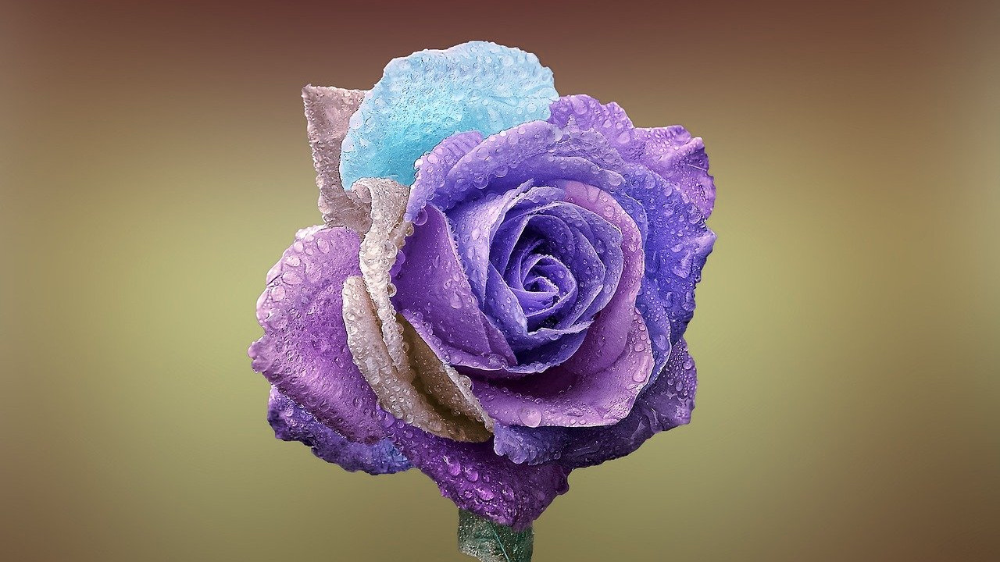

In [5]:
imgBGR = read_img_in_BGR('sample_imgs/rose.png')
imgRGB = read_img_in_RGB_defined('sample_imgs/rose.png')

###2- Récupération des valeurs des pixels en RGB. Vérification en écrivant trois images correspondantes chacune aux valeurs R, G et B.

J'utilise la fonction `split` de openCV2 pour séparer les couleurs puis j'utilise `merge` pour créer une image de mêmes dimensions d'image originale et ajouter chaque couleur(B , G, R) à l'image pour obtenir 3 images avec les 3 valeurs de R, G et B


In [6]:
def RGB_3_CHANNELS(img):
  B,G,R = cv2.split(img)
  mat = np.zeros_like(B)
  B = cv2.merge([B,mat,mat])
  G = cv2.merge([mat,G,mat])
  R = cv2.merge([mat,mat,R])

  cv2_imshow(B)
  cv2_imshow(G)
  cv2_imshow(R)



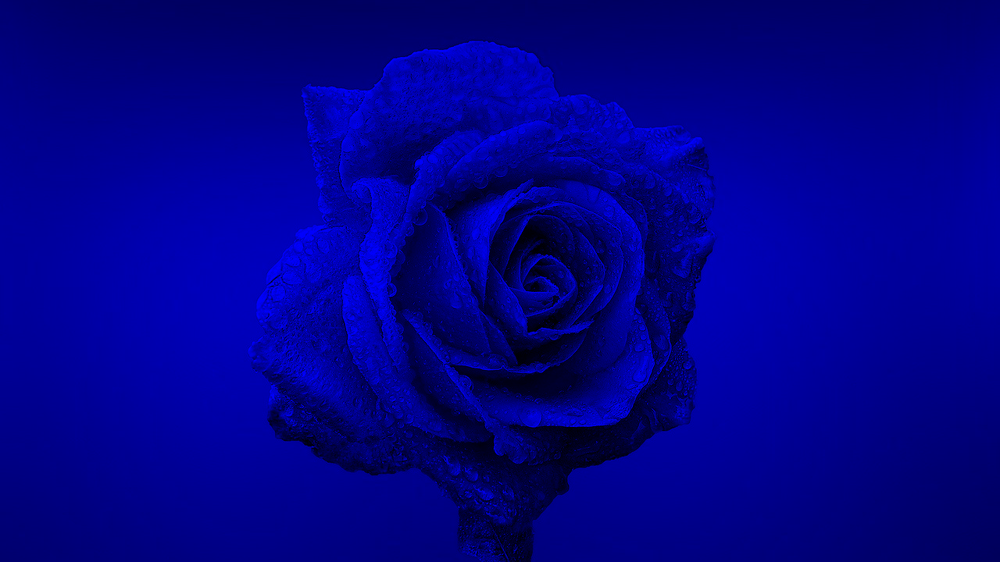

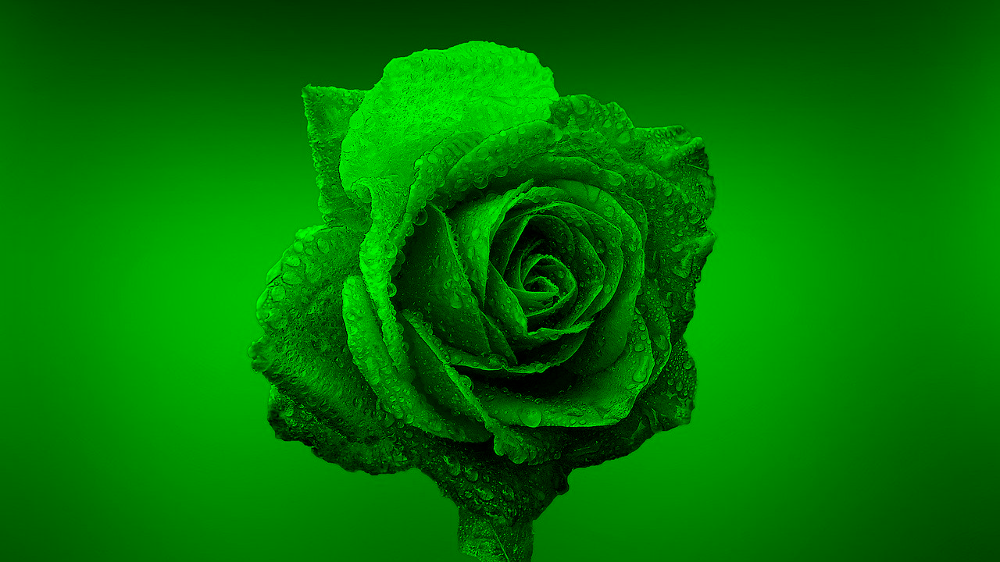

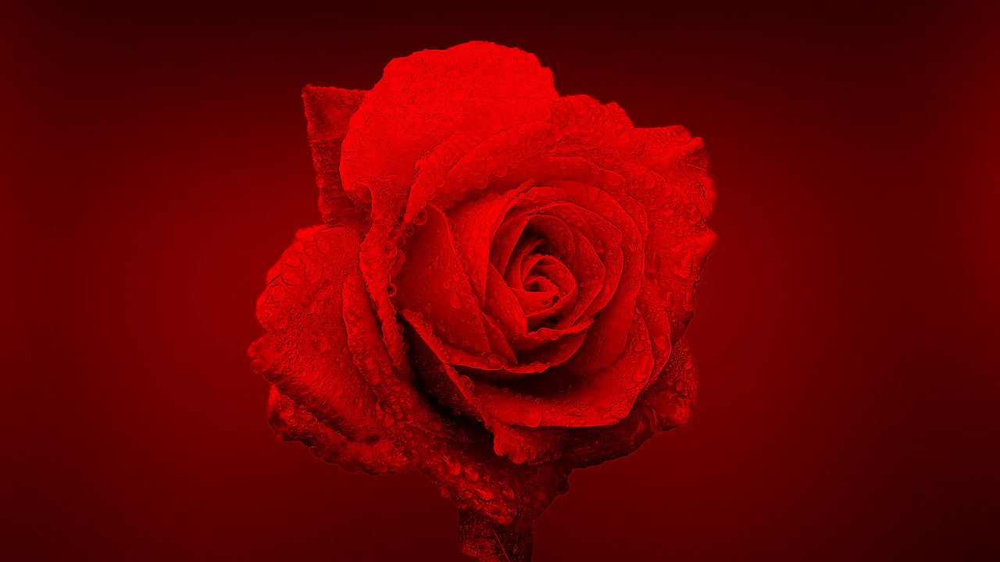

In [7]:

RGB_3_CHANNELS(imgBGR)

### 3- Conversion dans les espaces de couleurs vus en cours, HSV et Lab.

#### Conversion de BGR en RGB :

In [8]:
# fonction pour faire une conversion entre BGR en RGB
def conversion_2_rgb_defined(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

#### Conversion de BGR en HSV

OpenCV HSV a des valeurs différentes des valeurs normales quand il s'agit de la couleur de la teinte. Le normal H est de 0 à 360, mais la teinte de OpenCV est entre 0 et 180

In [9]:
# fonction pour faire une conversion entre BGR en HSV
def conversion_2_HSV_defined(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    #suffix = datetime.datetime.now().strftime("%y%m%d_%H%M%S")
    #cv2.imwrite('post_process/HSV_image'+ suffix +'.png',img)
    return img

[112 106 113]


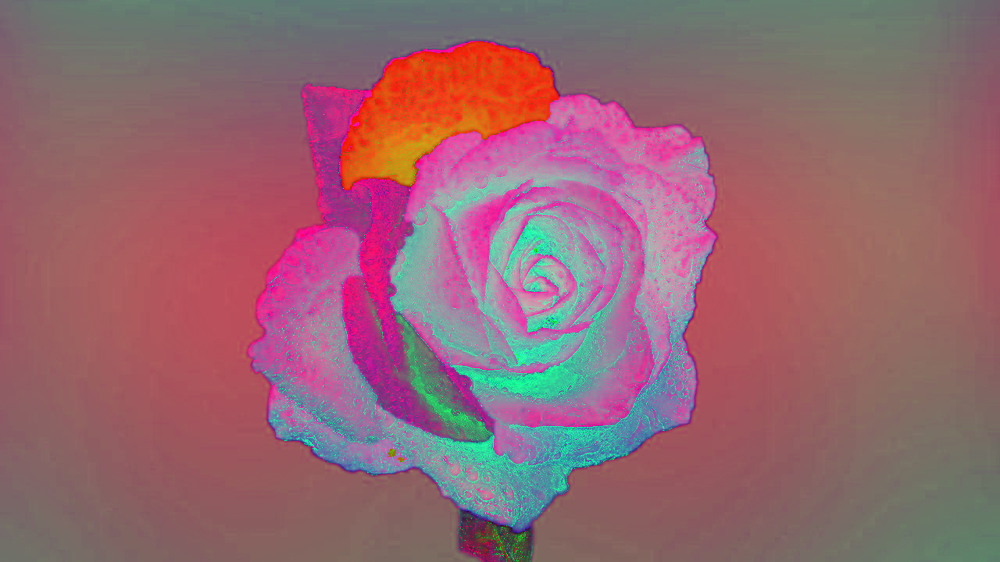

In [10]:
imgHSV_D =conversion_2_HSV_defined(imgBGR)
print(imgHSV_D[0,0,:])
cv2_imshow(imgHSV_D)

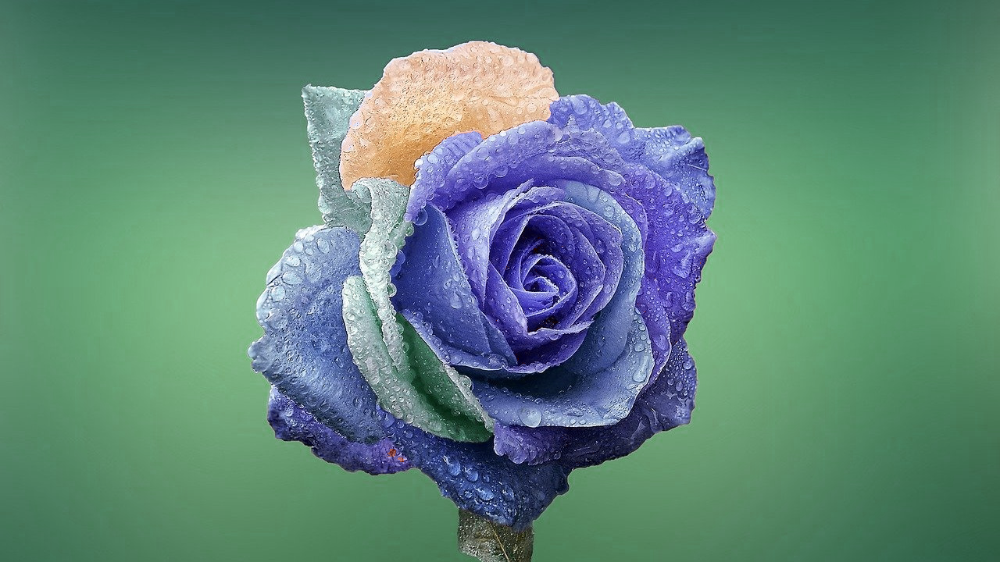

In [11]:
im1=Image.fromarray(np.asarray(imgHSV_D ,dtype=np.uint8), 'HSV')
display(im1.convert('RGB'))

#### Conversion de BGR en CIE_XYZ D65

In [12]:
def conversion_2_XYZ_defined(img):
    img = cv2.cvtColor(img,cv2.COLOR_BGR2XYZ)
    return img

#### Conversion de BGR en CIELAB D65

In [13]:
# fonction pour faire une conversion entre BGR en L*a*b
def conversion_2_Lab_defined(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    return img

[ 86 132 107]


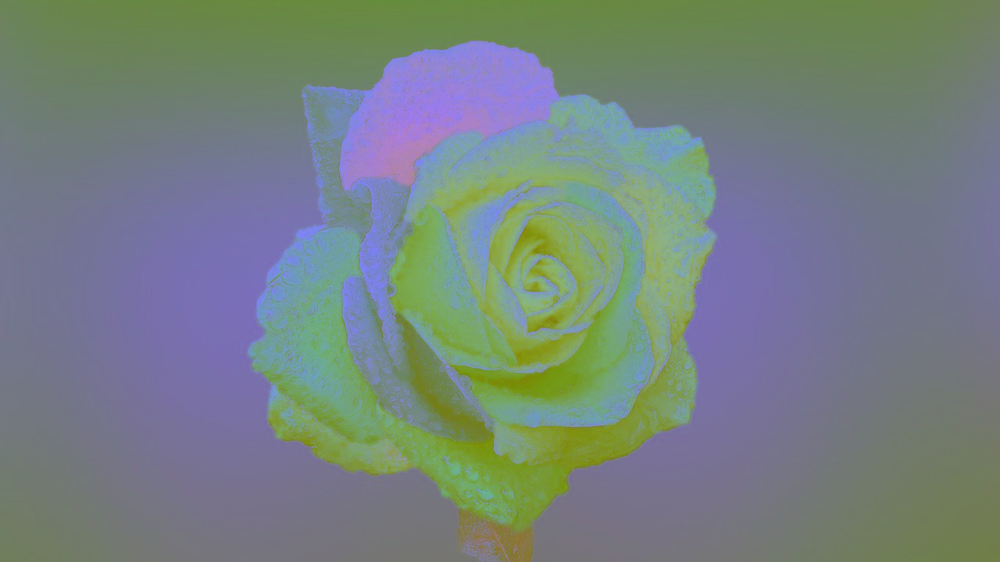

In [14]:
imgLab_D =conversion_2_Lab_defined(imgBGR)
print(imgLab_D[0,0,:])
cv2_imshow(imgLab_D)

### 4- Comparaison entre deux images

#### Calcul de distance euclidien

Dans `distance_color` au début je change le type des images en float pour avoir des résultats plus précis quand je fais le calcul.
Ensuite je calcule : 
$Distance = \sqrt{\Delta R^2 + \Delta G^2 + \Delta B^2}$
Pour obtenir la distance euclidienne entre 2 images dans la même espace de couleur.

In [15]:
# fonction pour faire la distance euclidienne entre 2 images
def distance_color(img1,img2,type):
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    delta = (img1[:,:,0] - img2[:,:,0])**2 + (img1[:,:,1] - img2[:,:,1])**2 + (img1[:,:,2] - img2[:,:,2])**2
    norm = np.sqrt(delta)
    avg = np.average(norm)
    return avg

#### Comparaison entre 2 images RGB et 2 images Lab

In [16]:
# l'application de la fonction de distance_color avec 2 images en RGB et 2 images en L*a*b
def euclidean_color_dist_defined(img,img2):
    img_rgb = conversion_2_rgb_defined(img)
    img_rgb2 = conversion_2_rgb_defined(img2)
    img_lab = conversion_2_Lab_defined(img)
    img_lab2 = conversion_2_Lab_defined(img2)
    dist1= distance_color(img_rgb,img_rgb2,'RGB_DEF')
    dist2= distance_color(img_lab,img_lab2,'LAB_DEF')

    print('distance for the 2 RGB images = '+ str(abs(dist1)) )
    print('distance for the 2 LAB images = '+ str(abs(dist2 )) +'\n' )

In [17]:
    
    imgBGR3 = read_img_in_BGR('sample_imgs/rose.png')
    imgBGR4 = read_img_in_BGR('sample_imgs/rose2.png')
    euclidean_color_dist_defined(imgBGR3,imgBGR4)

distance for the 2 RGB images = 135.537429276201
distance for the 2 LAB images = 75.80783614340106



Pour tester j'ai fait une boucle qui fait la comparaison entre 2 images qui ont leur nom comme chiffre de 0 à 7 

In [18]:
# 7 car il existe seulement 7 images de nom 0 à 7
for i in range(7):
        print('///// EX',i,'et', i+1, '///// \n')
        imgBGR =read_img_in_BGR('sample_imgs/' + str(i)+ '.png')
        imgBGR2 =read_img_in_BGR('sample_imgs/'+ str(i+1) +'.png')
        euclidean_color_dist_defined(imgBGR,imgBGR2)


///// EX 0 et 1 ///// 

distance for the 2 RGB images = 191.0
distance for the 2 LAB images = 100.9801960782408

///// EX 1 et 2 ///// 

distance for the 2 RGB images = 142.21462653327907
distance for the 2 LAB images = 81.09870529176159

///// EX 2 et 3 ///// 

distance for the 2 RGB images = 143.10835055998677
distance for the 2 LAB images = 21.84032966784158

///// EX 3 et 4 ///// 

distance for the 2 RGB images = 191.0
distance for the 2 LAB images = 93.66429415737906

///// EX 4 et 5 ///// 

distance for the 2 RGB images = 191.0
distance for the 2 LAB images = 188.1063528964402

///// EX 5 et 6 ///// 

distance for the 2 RGB images = 143.10835055998677
distance for the 2 LAB images = 25.35744466621191

///// EX 6 et 7 ///// 

distance for the 2 RGB images = 142.21462653327907
distance for the 2 LAB images = 76.03946343840128



On constate que la différence entre les espaces Lab est plus précis que celle en RGB 

## Fonctions from scratch

###3- Conversion dans les espaces de couleurs vus en cours, HSV et Lab.

####Conversion de BGR en RGB :
Je fais la conversion en remplaçant la colonne B par R et R par B 

In [19]:
def conversion_2_rgb_from_scratch(img):
    img = img[:, :, ::-1]
    return img

In [20]:
imgBGR = read_img_in_BGR('sample_imgs/rose.png')
imgRGB = conversion_2_rgb_from_scratch(imgBGR)
print(imgBGR[0,0,:])
print(imgRGB[0,0,:])

[113  79  66]
[ 66  79 113]


Conversion de RGB en BGR :

In [21]:
def conversion_2_bgr_from_scratch(img):
    img = img[:, :, ::-1]
    return img

In [22]:
imgRGB_BGR = conversion_2_bgr_from_scratch(imgRGB)
print(imgRGB_BGR[0,0,:])

[113  79  66]


#### Conversion de RGB en HSV
Pour faire la conversion entre RGB et HSV, il faut d'abord savoir que
le H désigne la teinte qui varie entre 0 et 360 et représente toutes les couleurs
Le S désigne saturation qui représente l'intensité de la couleur 
Le V désigne la luminosité
Ensuite pour la conversion, on doit représenter chaque couleur sur un cercle(Teinte) alors de 0 à 60 rouges, de 60 à 180 verts, de 180 à 300 bleus et de 300 à 359 rouges.
Et dépendant à l'intensité et la luminosité de la couleur, on varie le S et le V pour obtenir enfin l'image en HSV.

In [23]:
#H[0;359] S[0;255] V[0;255]
#OPENCV H[0;179] pour 8-bit images
#Pour un pixel
def rgb_to_hsv_pixel(r,g,b):
    r,g,b =r/255.0,g/255.0,b/255.0
    max_c = max(r,g,b)
    min_c = min(r,g,b)
    diff = max_c - min_c 
    v = max_c
    
    if (diff == 0):
        h = 0
    elif v == r :
        h = (60*(g-b) /diff) % 360
    elif v == g :
        h = 120 + (60*(b - r) /diff)
    elif v == b :
        h = 240 + (60*(r-g) /diff)
    

    if diff == 0:
        s = 0
    else :
        s = (diff/max_c) 

    v = v * 255
    s = s * 255

    return h ,s ,v

Ici on applique la fonction creer en haut dans une boucle pour changer l'image de RGB en HSV 

In [24]:

def conversion_2_HSV_from_scratch(img):
    rows , columns,_ = img.shape
    imgHSV = np.zeros_like(img)
    imgHSV = np.clip(imgHSV,0,359) # pour avoir des valeur de H entre [0;359] au lieu de [0;255]
    for i in range(rows):
        for j in range(columns):
            r,g,b = img[i][j]  
            h,s,v= rgb_to_hsv_pixel(r,g,b)
            h = round(h)
            imgHSV[i][j] = h,s,v

    return imgHSV

[223 106 113]


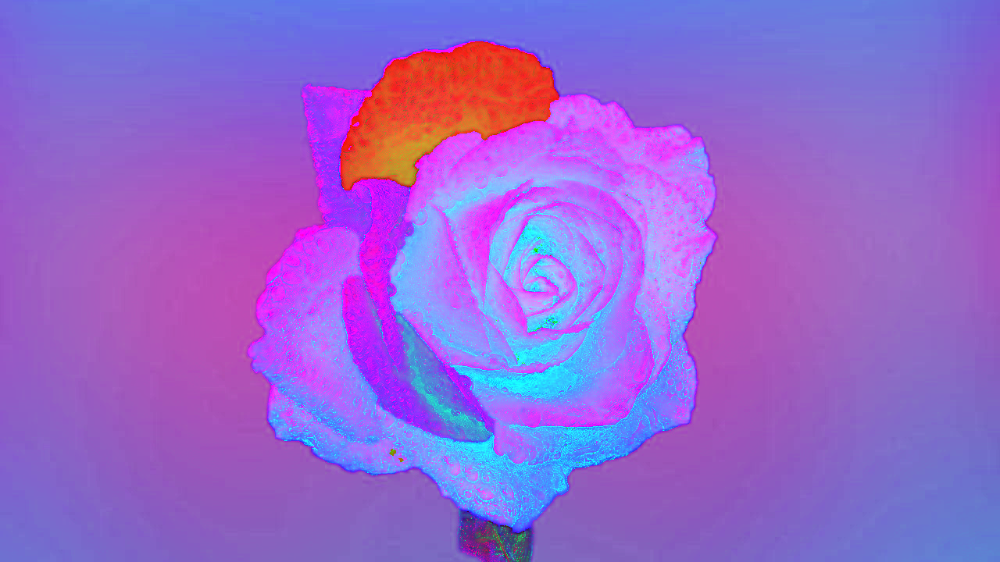

In [25]:
imgHSV_S = conversion_2_HSV_from_scratch(imgRGB)
print(imgHSV_S[0,0,:])
cv2_imshow(imgHSV_S)

#### Conversion de HSV en RGB

In [26]:
def hsv_to_rgb_pixel(h,s,v):
   
    s = s/255
    v = v/255
    C = s * v
    H = h/60
    X = C * (1 - abs((H % 2) - 1))
    m = v - C

    r = 0
    g = 0
    b = 0
    if (0<= H < 1 ):
        r = C
        g = X
        b = 0
    elif (1 <= H <2):
        r = X
        g = C
        b = 0
    elif (2 <= H < 3):
        r = 0
        g = C
        b = X
    elif (3 <= H < 4):
        r = 0 
        g = X
        b = C
    elif ( 4 <= H < 5):
        r = X
        g = 0
        b = C
    elif (5 <= h < 6):
        r = C
        g = 0
        b = X
    
    r = r + m
    r = r * 255
    g = g + m
    g = g * 255
    b = b + m
    b = b * 255

    return r,g,b

In [27]:
def conversion_HSV_2_RGB_from_scratch(img):
    rows, columns,_ = img.shape
    imgRGB = np.zeros_like(img)
    imgRGB = np.clip(imgRGB,0,255)
    for i in range(rows):
        for j in range(columns):
            h,s,v = img[i][j]
            r,g,b = hsv_to_rgb_pixel(h,s,v)
            r = round(r)
            g = round(g)
            b = round(b)
            imgRGB[i][j] = r,g,b

    return imgRGB

[ 66  79 113]


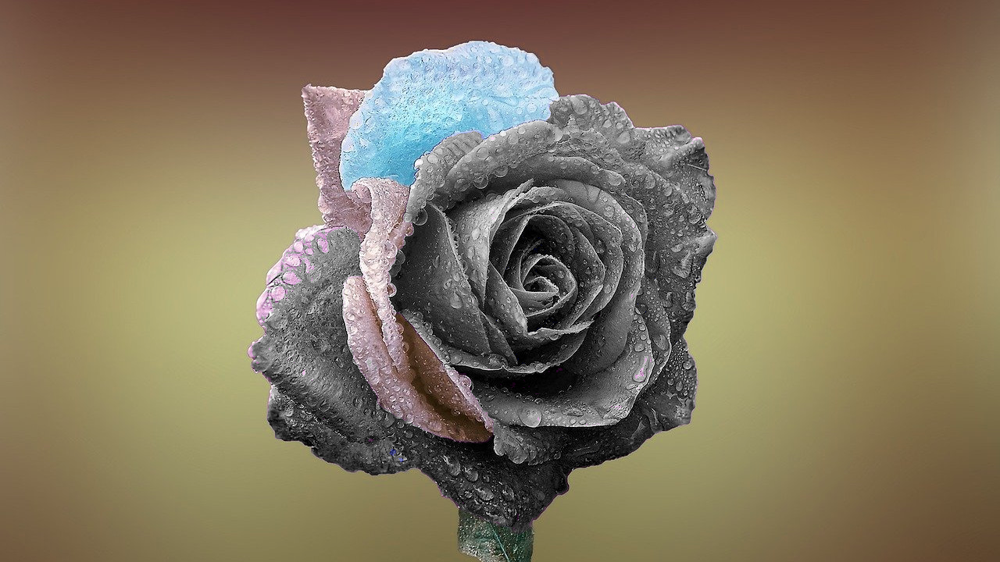

In [28]:
imgHSV_RGB = conversion_HSV_2_RGB_from_scratch(imgHSV_S)
print(imgHSV_RGB[0,0,:])
cv2_imshow(imgHSV_RGB)

#### Conversion de RGB en CIELAB

Fonction intermidiaire pour calculer f(t) tel que t = X/Xreference ou Y/Yreference ou Z/Zreference en le comparant avec $\delta ^3$

In [29]:
def f_T(t):
    if (t > 0.008856):
       return t**(1/3)
    else :
        return (903.3*t + 16) /116

Pour la conversion de RGB en CIE LAB on doit d'abord transformer le RGB en CIEXYZ en utilisant une matrice prédéfinie d'un illuminant de référence achromatique blanc spécifié (D65).
L représente la luminosité a représenté les couleurs rouges et vertes et b représente les couleurs bleues et jaunes

In [30]:
def rgb_2_Lab_pixel(r,g,b,Illuminant,type):
    matrix = np.array(
                        [[0.412453, 0.357580, 0.180423],
                        [0.212671, 0.715160, 0.072169],
                        [0.019334, 0.119193, 0.950227]]) 

    RGB = [r/255,g/255,b/255]
    XYZ = np.dot(matrix,RGB)

    x,y,z = XYZ
    
    if (Illuminant == 65): #D65
        x = x/0.950489
        z = z/1.088840
    elif(Illuminant == 50): #D50
        x = x/0.964212
        z = z/0.825188
    else: #Opencv D65
        x = x/0.950456
        z = z/1.088754

    if (y> 0.008856):
        L = 116*(y**(1/3)) -16
    else:
        L = 903.3 * y   

    if ( type == "uint8"):
        delta = 128
    else:
        delta = 0 
    
    a = (500*(f_T(x) - f_T(y))) + delta
    b = (200*(f_T(y) - f_T(z))) + delta

    


    L = (L * 255) /100

    return L,a,b

In [31]:
def conversion_2_Lab_from_scratch(img):
    rows , columns,_ = img.shape
    imgLAB = np.zeros_like(img)
    imgLAB = np.clip(imgLAB,-200,200)
    for i in range(rows):
        for j in range(columns):
            r,g,b = img[i][j]
            L,a,B = rgb_2_Lab_pixel(r,g,b,5,img.dtype)
            L = round(L)
            a = round(a)
            B - round(B)
            imgLAB[i][j] = L,a,B

    return imgLAB

[159 130 112]


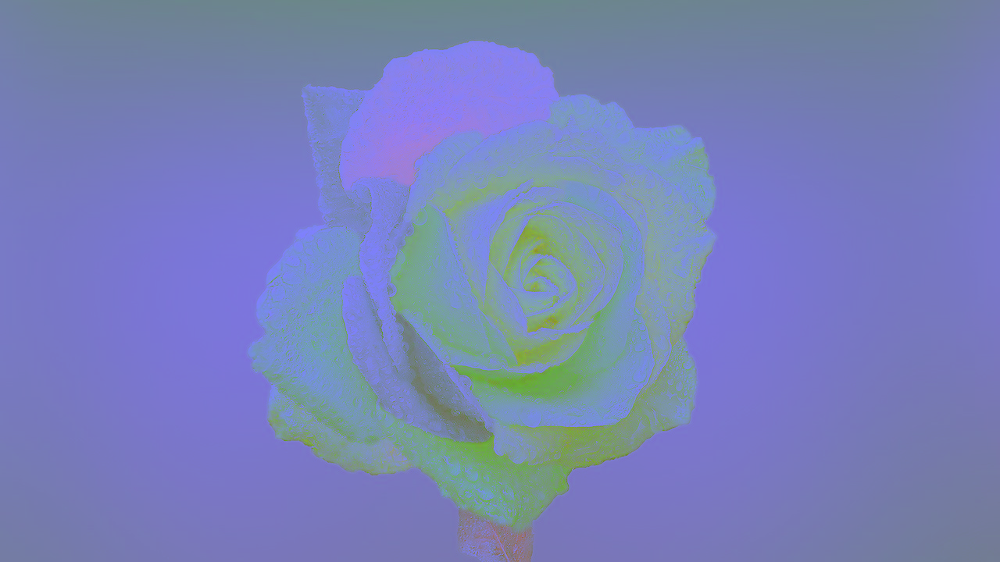

In [32]:
imgLab_S = conversion_2_Lab_from_scratch(imgRGB)
print(imgLab_S[0,0,:])
cv2_imshow(imgLab_S)

###4- Comparaison entre deux images

####Calcul de distance euclidien

Dans distance_color au début, je change le type des images en float pour avoir des résultats plus précis quand je fais le calcul. Ensuite je calcule : $Distance=\sqrt{ΔR2+ΔG2+ΔB2}$ pour obtenir la distance euclidienne entre 2 images dans la même espace de couleur.



In [33]:
# fonction pour faire la distance euclidienne entre 2 images
def distance_color(img1,img2,type):
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    delta = (img1[:,:,0] - img2[:,:,0])**2 + (img1[:,:,1] - img2[:,:,1])**2 + (img1[:,:,2] - img2[:,:,2])**2
    norm = np.sqrt(delta)
    cv2.imwrite('post_process/diff'+ type + '.png',norm)
    avg = np.average(norm)
    return avg

#### Comparaison entre 2 images RGB et 2 images Lab

In [34]:
def euclidean_color_dist_scratch(img,img2):
    img_rgb = conversion_2_rgb_from_scratch(img)
    img_rgb2 = conversion_2_rgb_from_scratch(img2)
    img_lab = conversion_2_Lab_from_scratch(img_rgb)
    img_lab2 = conversion_2_Lab_from_scratch(img_rgb2)
    dist1= distance_color(img_rgb,img_rgb2,'RGB_SCR')
    dist2= distance_color(img_lab,img_lab2,"LAB_SCR")
    
    print('distance for the 2 RGB images = '+ str(abs(dist1)) )
    print('distance for the 2 LAB images = '+ str(abs(dist2 )) +'\n' )

In [35]:
    imgBGR3 = read_img_in_BGR('sample_imgs/rose.png')
    imgBGR4 = read_img_in_BGR('sample_imgs/rose2.png')
    euclidean_color_dist_scratch(imgBGR3,imgBGR4)

distance for the 2 RGB images = 135.537429276201
distance for the 2 LAB images = 48.5657007102233



## MAIN :

POUR TESTER TOUT ENSEMBLE

In [36]:
def number_of_example(count):

       
    imgBGR = read_img_in_BGR('sample_imgs/rose.png')
    imgRGB = conversion_2_rgb_from_scratch(imgBGR)
    print("RGB ", imgRGB[0,0,:])

    imgHSV = conversion_2_HSV_from_scratch(imgRGB)
    imgHSV2 = conversion_2_HSV_defined(imgBGR)
        
    cv2.imwrite('post_process/HSV_SCRATCH.png',imgHSV * 255 )
    cv2.imwrite('post_process/HSV_DEFINED.png',imgHSV2)

    print("HSV 1 SCRATCH :",imgHSV[0,0,:])
    print("HSV 2 DEFINED :",imgHSV2[0,0,:])   

    HSV_RGB_SCRATCH = conversion_HSV_2_RGB_from_scratch(imgHSV)
    HSV_BGR_DEFINED = cv2.cvtColor(imgHSV2, cv2.COLOR_HSV2BGR)
    RGB_BGR = conversion_2_bgr_from_scratch(HSV_RGB_SCRATCH)
    
    cv2.imwrite('post_process/HSV_RGB_SCRATCH.png',HSV_RGB_SCRATCH * 255)
    cv2.imwrite('post_process/HSV_BGR_DEFNED.png',HSV_BGR_DEFINED)
    
    print("HSV TO RGB TO BGR SCRATCH : ",RGB_BGR[0,0,:])
    print("HSV RO BGR DEFINED : ",HSV_BGR_DEFINED[0,0,:])  
      
    
    imgLAB = conversion_2_Lab_from_scratch(imgRGB)
    imgLAB2 = conversion_2_Lab_defined(imgBGR)
    print("LAB 1 SCRATCH : ",imgLAB[0,0,:])
    print("LAB 2 DEFINED : ",imgLAB2[0,0,:])
    
    cv2.imwrite('post_process/LAB_SCRATCH.png',imgLAB)
    cv2.imwrite('post_process/LAB_DEFINED.png',imgLAB2) 

    for i in range(7):
        print('///// EX',i,'et', i+1, '///// \n')
        imgBGR =read_img_in_BGR('sample_imgs/' + str(i)+ '.png')
        imgBGR2 =read_img_in_BGR('sample_imgs/'+ str(i+1) +'.png')
        euclidean_color_dist_defined(imgBGR,imgBGR2)



    

In [37]:
def main():
    number_of_example(7)

if __name__ == '__main__':
    main()

RGB  [ 66  79 113]
HSV 1 SCRATCH : [223 106 113]
HSV 2 DEFINED : [112 106 113]
HSV TO RGB TO BGR SCRATCH :  [113  79  66]
HSV RO BGR DEFINED :  [113  78  66]
LAB 1 SCRATCH :  [159 130 112]
LAB 2 DEFINED :  [ 86 132 107]
///// EX 0 et 1 ///// 

distance for the 2 RGB images = 191.0
distance for the 2 LAB images = 100.9801960782408

///// EX 1 et 2 ///// 

distance for the 2 RGB images = 142.21462653327907
distance for the 2 LAB images = 81.09870529176159

///// EX 2 et 3 ///// 

distance for the 2 RGB images = 143.10835055998677
distance for the 2 LAB images = 21.84032966784158

///// EX 3 et 4 ///// 

distance for the 2 RGB images = 191.0
distance for the 2 LAB images = 93.66429415737906

///// EX 4 et 5 ///// 

distance for the 2 RGB images = 191.0
distance for the 2 LAB images = 188.1063528964402

///// EX 5 et 6 ///// 

distance for the 2 RGB images = 143.10835055998677
distance for the 2 LAB images = 25.35744466621191

///// EX 6 et 7 ///// 

distance for the 2 RGB images = 142.214